In [17]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from keras.layers import Dense, Conv2D, MaxPooling2D,Flatten, Reshape, Dropout, BatchNormalization,LeakyReLU, Conv2DTranspose, ReLU
from keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot as plt
import numpy as np
import plotly.express as px
import os
import random
import pandas as pd

In [18]:
generator = keras.models.load_model('generator_for_kaggle_cloth.h5')
discriminator = keras.models.load_model('discriminator_for_kaggle_cloth.h5')
generator_3dim = keras.models.load_model('generator_for_kaggle_cloth_3dim.h5')
discriminator_3dim = keras.models.load_model('discriminator_for_kaggle_cloth_3dim.h5')

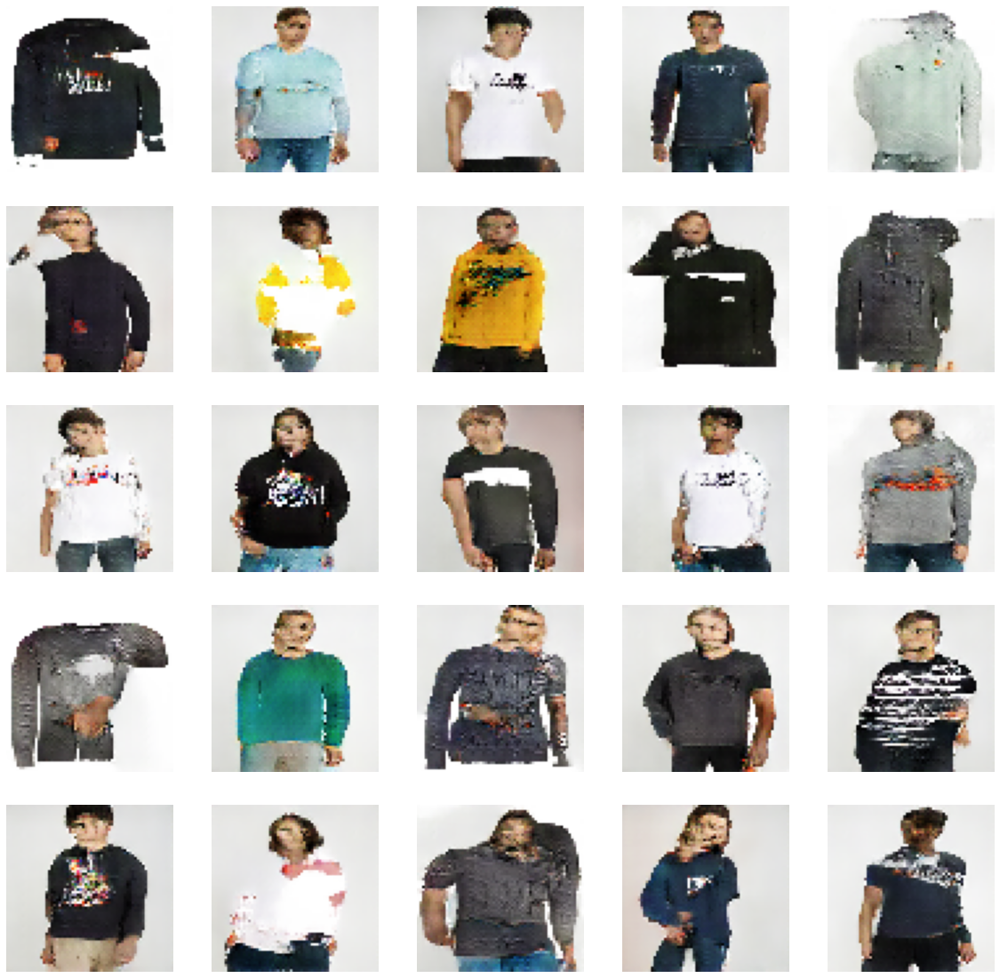

In [19]:
g =5
seed = tf.random.normal([g**2, 100])

generated_images = generator(seed)
generated_images = (generated_images * 127.5) + 127.5
generated_images.numpy()
num_img = g**2
fig = plt.figure(figsize=(20, 20))
for i in range(num_img):
    plt.subplot(g, g, i+1)
    img = keras.utils.array_to_img(generated_images[i]) 
    plt.imshow(img)
    plt.axis('off')
plt.show()

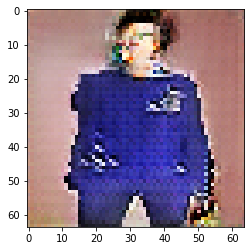

In [100]:
plt.imshow(keras.utils.array_to_img(generator_3dim(tf.expand_dims(np.array([1,-1,-4]),axis = 0))[0]))

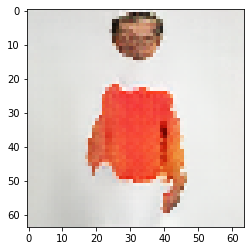

In [98]:
plt.imshow(keras.utils.array_to_img(generator_3dim(tf.expand_dims(np.array([0,0,0]),axis = 0))[0]))

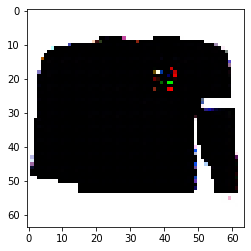

In [78]:
plt.imshow(keras.utils.array_to_img(generator_3dim(tf.expand_dims(np.array([9,6.5,5.5]),axis = 0))[0]))

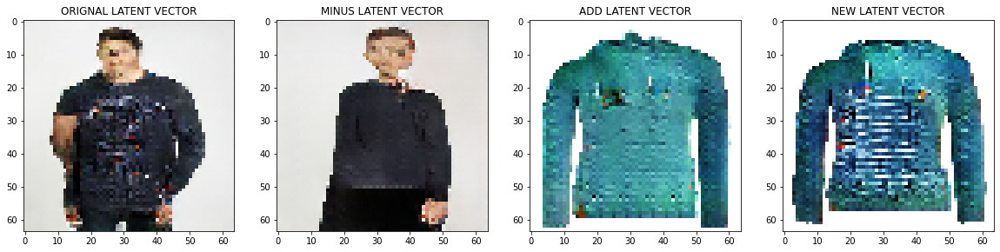

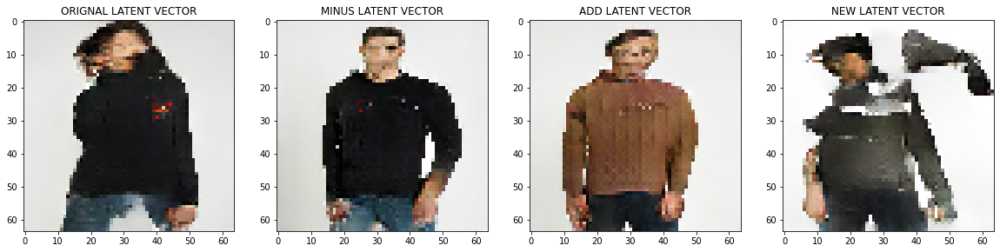

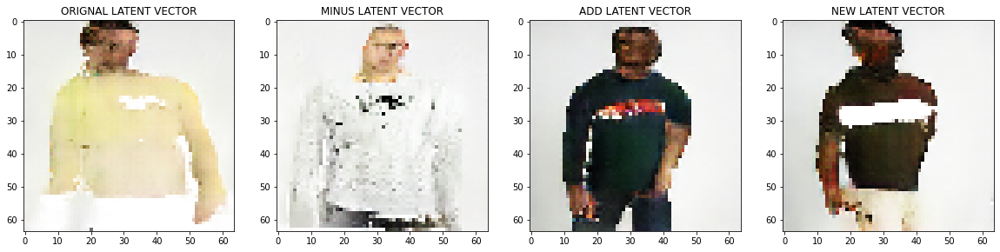

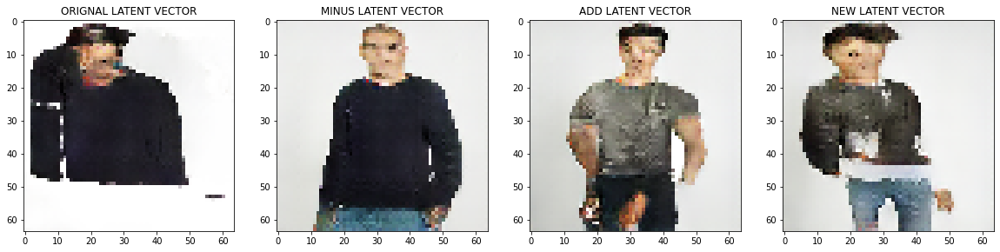

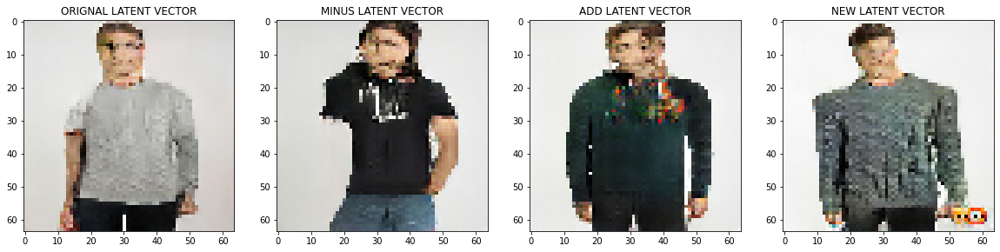

In [74]:
# latent space 
np.random.seed = 5
for i in range(0,5):
    src_2 = np.random.normal(0,1,size = 100)
    src_1 = np.random.normal(0,1,size = 100)
    origin = np.random.normal(0,1,size = 100)
    new = origin - src_1 + src_2

    fig, ax = plt.subplots(1,4, figsize = (20,5))
    ax[0].imshow(keras.utils.array_to_img(generator(tf.expand_dims(origin,axis = 0))[0]))
    ax[0].title.set_text('ORIGNAL LATENT VECTOR')
    ax[1].imshow(keras.utils.array_to_img(generator(tf.expand_dims(src_1,axis = 0))[0]))
    ax[1].title.set_text('MINUS LATENT VECTOR')
    ax[2].imshow(keras.utils.array_to_img(generator(tf.expand_dims(src_2,axis = 0))[0]))
    ax[2].title.set_text('ADD LATENT VECTOR')
    ax[3].imshow(keras.utils.array_to_img(generator(tf.expand_dims(new,axis = 0))[0]))
    ax[3].title.set_text('NEW LATENT VECTOR')

### In order to visualize the latent space of the generative model, I trained another generative model only with 3 dim latent space 

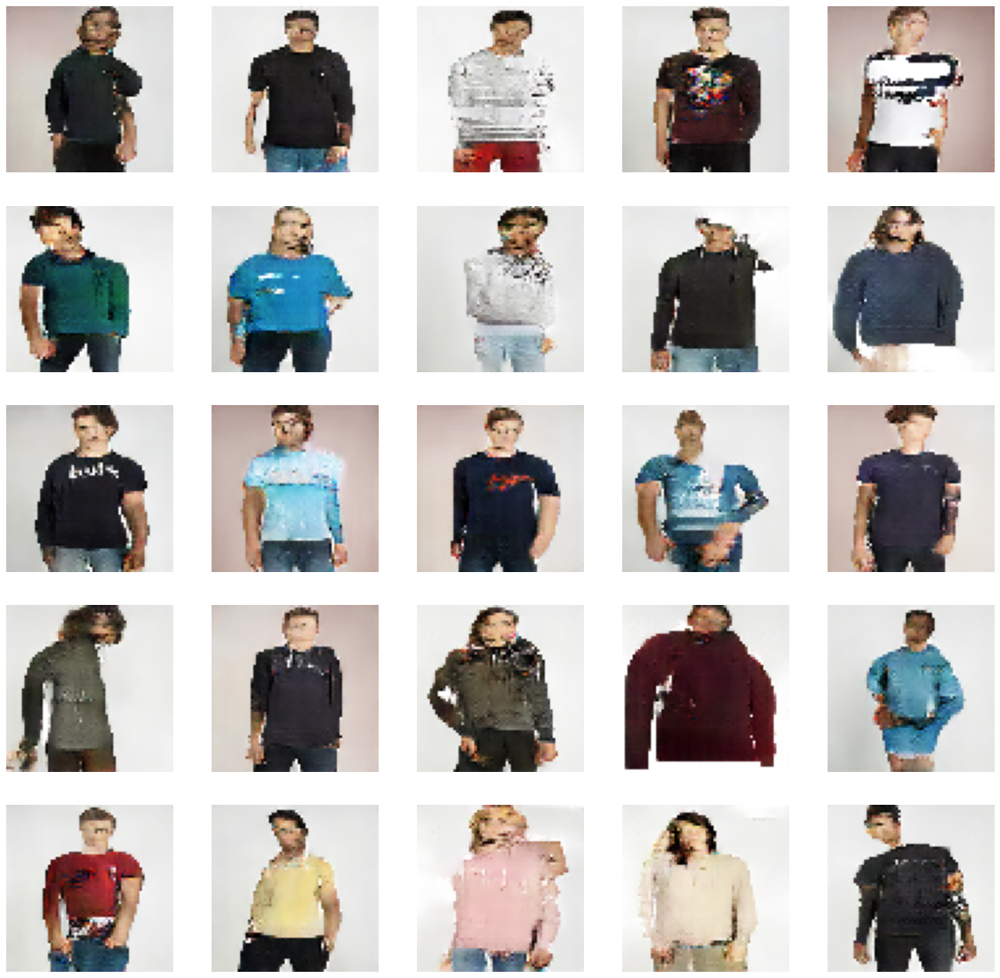

In [5]:
### 100 DIM gen model

g =5
seed = tf.random.normal([g**2, 100])

generated_images = generator(seed)
generated_images = (generated_images * 127.5) + 127.5
generated_images.numpy()
num_img = g**2
fig = plt.figure(figsize=(20, 20))
for i in range(num_img):
    plt.subplot(g, g, i+1)
    img = keras.utils.array_to_img(generated_images[i]) 
    plt.imshow(img)
    plt.axis('off')
plt.show()

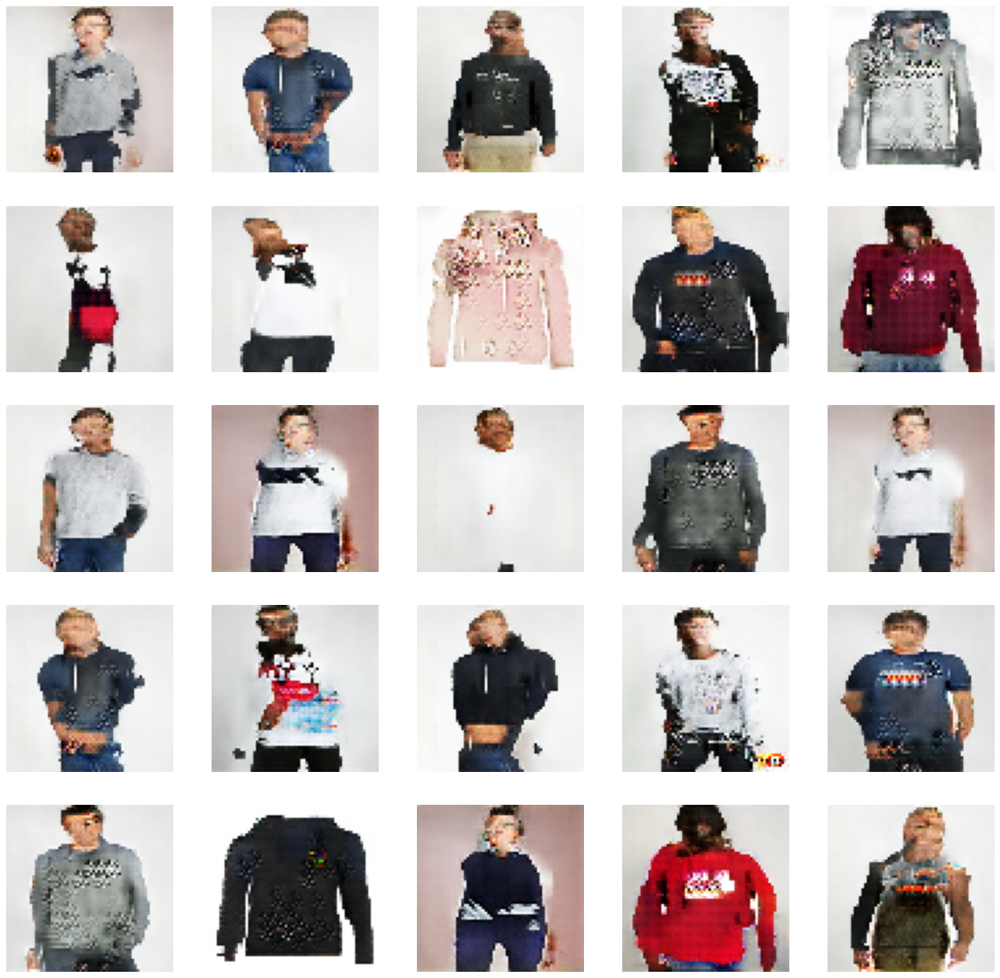

In [6]:
### 3 DIM gen model
g =5
seed = tf.random.normal([g**2, 3])

generated_images = generator_3dim(seed)
generated_images = (generated_images * 127.5) + 127.5
generated_images.numpy()
num_img = g**2
fig = plt.figure(figsize=(20, 20))
for i in range(num_img):
    plt.subplot(g, g, i+1)
    img = keras.utils.array_to_img(generated_images[i]) 
    plt.imshow(img)
    plt.axis('off')
plt.show()

`It seems no big difference of their generated images. But after plotting more images, the 3_dim generator seems lack of variaty of cloth style.`

In [7]:
# because orignal data is not labeled as I wanted so I only manually labeled 667 imgs to train the classifier
#path = 'Z:\DataSets\Only_cloth_or_cloth_with_person'
#def prep_fn(img):
#    img = img.astype(np.float32) / 255.0
#    img = (img - 0.5) * 2
#    return img
#gen = ImageDataGenerator(preprocessing_function = prep_fn)
#training_img = gen.flow_from_directory(directory=path, batch_size = 64, target_size = (64,64), class_mode='binary')
## Build a classifier to classify images with model or not
#classifier =  Sequential([
#    Conv2D(128, (5,5), strides = (2,2), padding = 'same', input_shape = (64,64,3)), # input_shape = (64,64,3)
#    LeakyReLU(),
#    Dropout(0.2),
#    
#    Conv2D(256, (5,5), strides = (2,2), padding = 'same'),
#    LeakyReLU(),
#    Dropout(0.2),
#    
#    Conv2D(512, (5,5), strides = (2,2), padding = 'same'),
#    LeakyReLU(),
#    Dropout(0.2),
#    
#    Flatten(),
#    Dense(1, activation = 'sigmoid')
#])
#classifier.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics=['accuracy'])
#
## 1for cloth with model , 0 for only cloth
#for i in training_img:
#    for m in range(len(i[0])):
#        plt.imshow(i[0][m])
#        plt.show()
#        print(i[1][m])
#    break
#epochs = 10
#classifier.fit(training_img , epochs=epochs)
#classifier.save('cloth_with_model_classifier.h5')
classifier = keras.models.load_model('cloth_with_model_classifier.h5')

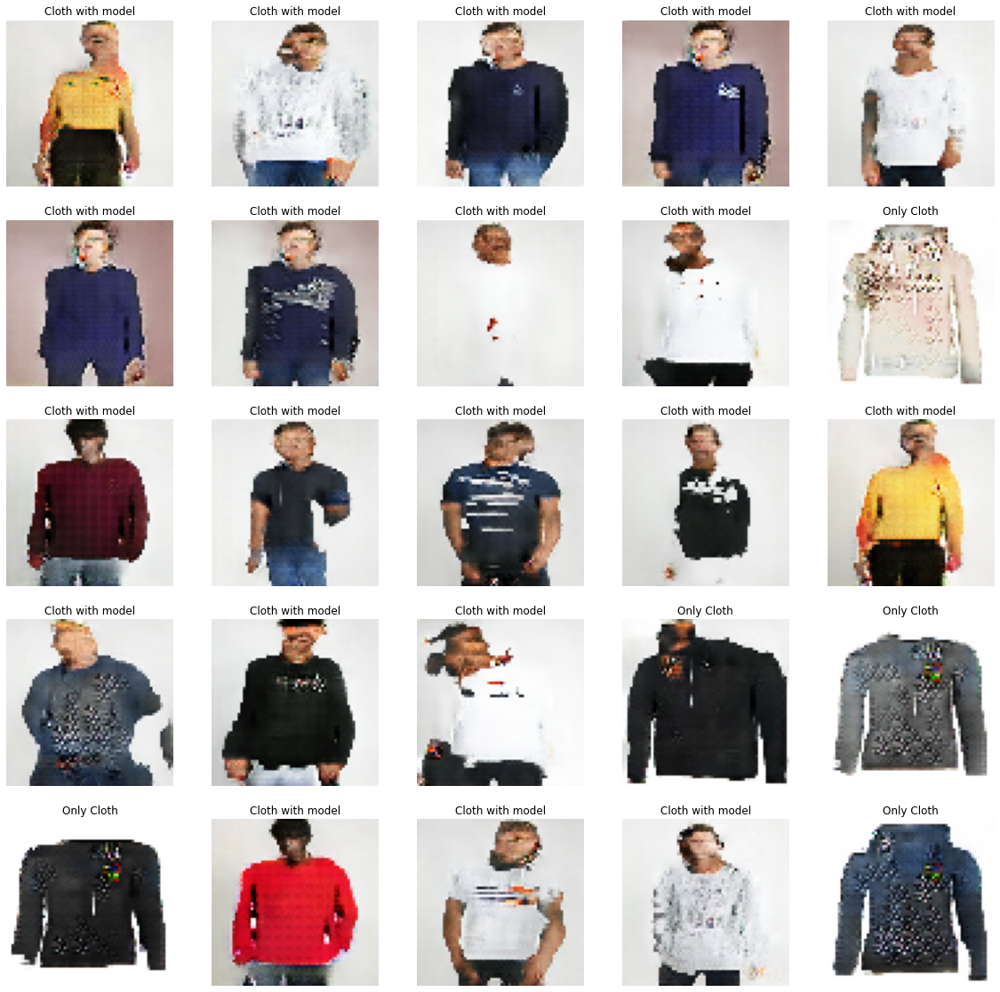

In [75]:
### Check the accuracy of the classifier on 3_dim generator

g =5
seed = tf.random.normal([g**2, 3])

generated_images = generator_3dim(seed)
label_list = []
for i in generated_images:
    prob = np.array(classifier(tf.expand_dims(i, axis = 0))).tolist()[0][0]
    if prob >= 0.5:
        label_list.append('Cloth with model')
    elif prob < 0.5:
        label_list.append('Only Cloth')
    
generated_images = (generated_images * 127.5) + 127.5
generated_images.numpy()
num_img = g**2
fig = plt.figure(figsize=(20, 20))
for i in range(num_img):
    plt.subplot(g, g, i+1)
    img = keras.utils.array_to_img(generated_images[i]) 
    plt.title(label_list[i])
    plt.imshow(img)
    plt.axis('off')
plt.show()

### `The performance of the classifier is good.`

# 3D plot for the latent expression for only_cloth and cloth_with_model

In [9]:
dot_num = 10000
dot_space = np.random.normal(loc = 0, scale = 4, size = (dot_num,3))
dot_space = pd.DataFrame(dot_space)
label = []
for i in range(dot_num):
    img = generator_3dim(tf.expand_dims(dot_space.iloc[i,:], axis = 0))
    prob = np.array(classifier(img)).tolist()[0][0]
    if prob >= 0.5:
        label.append('Cloth with model')
    elif prob < 0.5:
        label.append('Only Cloth')
dot_space['label'] = pd.DataFrame(label)
px.scatter_3d(dot_space,x = 0, y = 1, z = 2, color = label)

### `The distribution of generated images are clearly separable with a plane in the latent space, the sementic meaning is hidden continuously in the latent space!`

# 3D plot for the latent expression for red_cloth and other_cloth

In [10]:
# because orignal data is not labeled as I wanted so I only manually labeled 667 imgs to train the classifier
path = 'color_cloth'
def prep_fn(img):
    img = img.astype(np.float32) / 255.0
    img = (img - 0.5) * 2
    return img
gen = ImageDataGenerator(preprocessing_function = prep_fn)
training_img = gen.flow_from_directory(directory=path, batch_size = 64, target_size = (64,64), class_mode='binary')

Found 158 images belonging to 2 classes.


In [11]:
#classifier_1 =  Sequential([
#    Conv2D(128, (5,5), strides = (2,2), padding = 'same', input_shape = (64,64,3)), # input_shape = (64,64,3)
#    LeakyReLU(),
#    Dropout(0.2),
#    
#    Conv2D(256, (5,5), strides = (2,2), padding = 'same'),
#    LeakyReLU(),
#    Dropout(0.2),
#    
#    Conv2D(512, (5,5), strides = (2,2), padding = 'same'),
#    LeakyReLU(),
#    Dropout(0.2),
#    
#    Flatten(),
#    Dense(1, activation = 'sigmoid')
#])
#classifier_1.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics=['accuracy'])
#
## 1 for other color cloth, 0 for red cloth
#for i in training_img:
#    for m in range(len(i[0])):
#        plt.imshow(i[0][m])
#        plt.show()
#        print(i[1][m])
#    break
#epochs = 10
#classifier_1.fit(training_img , epochs=epochs)
#classifier_1.save('cloth_color_classifier.h5')
classifier_1 = keras.models.load_model('cloth_color_classifier.h5')

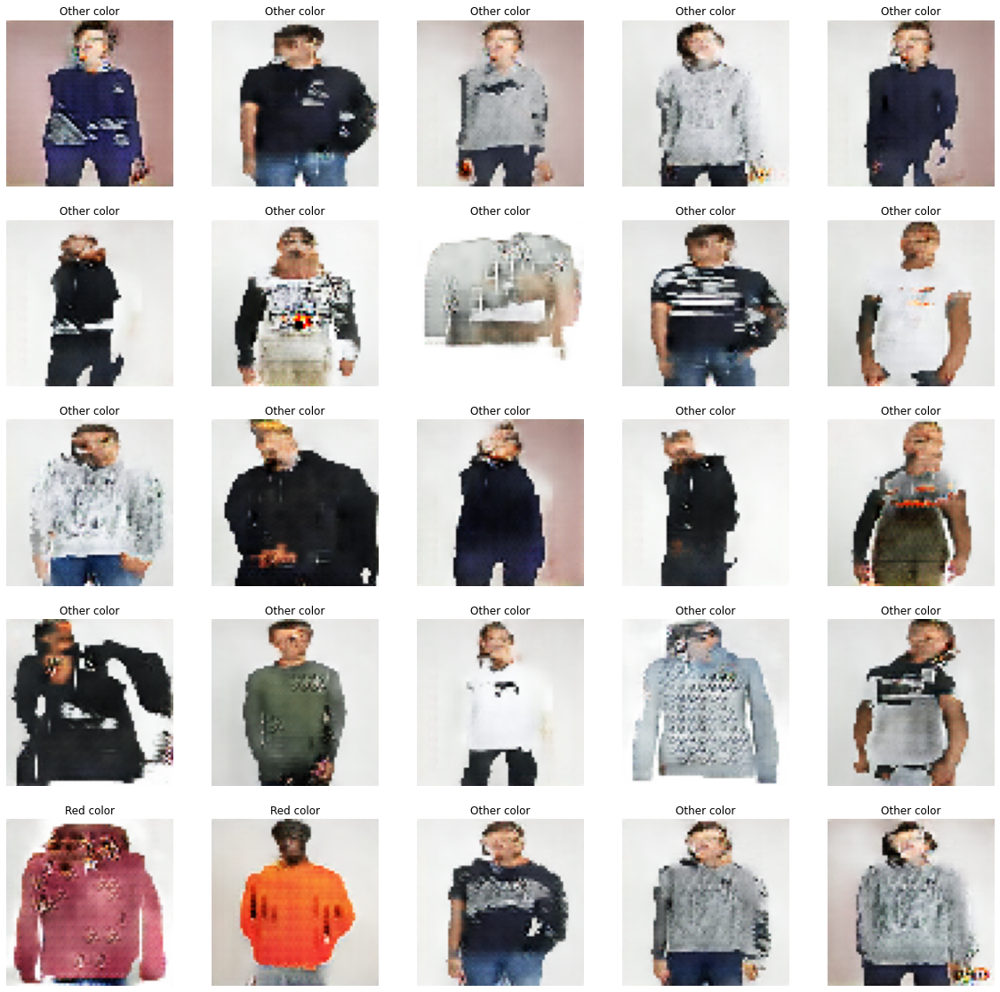

In [102]:
### Check the accuracy of the classifier on 3_dim generator
g =5
seed = tf.random.normal([g**2, 3])

generated_images = generator_3dim(seed)
label_list = []
for i in generated_images:
    prob = np.array(classifier_1(tf.expand_dims(i, axis = 0))).tolist()[0][0]
    if prob >= 0.5:
        label_list.append('Other color')
    elif prob < 0.5:
        label_list.append('Red color')
    
generated_images = (generated_images * 127.5) + 127.5
generated_images.numpy()
num_img = g**2
fig = plt.figure(figsize=(20, 20))
for i in range(num_img):
    plt.subplot(g, g, i+1)
    img = keras.utils.array_to_img(generated_images[i]) 
    plt.title(label_list[i])
    plt.imshow(img)
    plt.axis('off')
plt.show()

#### `The performance is Okay.`

In [13]:
dot_num = 10000
dot_space = np.random.normal(loc = 0, scale = 4, size = (dot_num,3))
dot_space = pd.DataFrame(dot_space)
label = []
for i in range(dot_num):
    img = generator_3dim(tf.expand_dims(dot_space.iloc[i,:], axis = 0))
    prob = np.array(classifier_1(img)).tolist()[0][0]
    if prob >= 0.5:
        label.append('Other Color')
    elif prob < 0.5:
        label.append('Red Color')
dot_space['label'] = pd.DataFrame(label)
px.scatter_3d(dot_space,x = 0, y = 1, z = 2, color = label)

In [15]:
dot_num = 10000
dot_space = np.random.normal(loc = 0, scale = 4, size = (dot_num,3))
dot_space = pd.DataFrame(dot_space)
label = []
for i in range(dot_num):
    img = generator_3dim(tf.expand_dims(dot_space.iloc[i,:], axis = 0))
    prob = np.array(classifier_1(img)).tolist()[0][0]
    if prob >= 0.5:
        label.append('Other Color')
    elif prob < 0.5:
        label.append('Red Color')
dot_space['label'] = pd.DataFrame(label)
px.scatter_3d(dot_space,x = 0, y = 1, z = 2)

In [104]:
dot_num = 10000
dot_space = np.random.normal(loc = 0, scale = 4, size = (dot_num,3))
dot_space = pd.DataFrame(dot_space)
label = []
for i in range(dot_num):
    img = generator_3dim(tf.expand_dims(dot_space.iloc[i,:], axis = 0))
    prob_c = np.array(classifier_1(img)).tolist()[0][0]
    prob_m = np.array(classifier(img)).tolist()[0][0]
    if prob_c >= 0.5:
        if prob_m >= 0.5:
            label.append('Cloth with model: other_color')
        elif prob_m < 0.5:
            label.append('Only Cloth: other_color')
    elif prob_c < 0.5:
        if prob_m >= 0.5:
            label.append('Cloth with model: red_color')
        elif prob_m < 0.5:
            label.append('Only Cloth: red_color')
dot_space['label'] = pd.DataFrame(label)
px.scatter_3d(dot_space,x = 0, y = 1, z = 2, color = label)